<a href="https://colab.research.google.com/github/saadan1234/Optical-Network-and-Technologies/blob/main/T7ExplainableAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Import

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

file_path = '/content/drive/MyDrive/DataSet_EU_3k_5k.xlsx'
data = pd.read_excel(file_path)
data.head()

,Power_1,Power_2,Power_3,Power_4,Power_5,Power_6,Power_7,Power_8,Power_9,Power_10,...,GSNR_69,GSNR_70,GSNR_71,GSNR_72,GSNR_73,GSNR_74,GSNR_75,GSNR_76,No. Spans,Total Distance(m)
0,0.000000,0.000000,0.000007,0.000007,0.000007,0.000000,0.000007,0.0,0.000007,0.0,...,90.061284,0.000000,0.000000,0.000000,0.000000,95.045789,0.000000,0.000000,8,690608.0
1,0.000000,0.000007,0.000000,0.000007,0.000000,0.000007,0.000000,0.0,0.000000,0.0,...,0.000000,92.560867,0.000000,0.000000,89.544975,0.000000,0.000000,0.000000,8,690608.0
2,0.000000,0.000000,0.000000,0.000007,0.000000,0.000000,0.000000,0.0,0.000007,0.0,...,0.000000,0.000000,90.991977,0.000000,0.000000,0.000000,85.512399,83.114113,8,690608.0
3,0.000007,0.000007,0.000007,0.000007,0.000007,0.000000,0.000000,0.0,0.000007,0.0,...,76.409583,73.664915,74.651700,79.071217,0.000000,0.000000,0.000000,0.000000,8,690608.0
4,0.000000,0.000000,0.000007,0.000000,0.000007,0.000000,0.000000,0.0,0.000007,0.0,...,0.000000,0.000000,78.299438,74.910765,72.030907,73.790264,81.190439,0.000000,8,690608.0


# Individual Visualizations

Correlation Matrix:
                    Power_1     ASE_1     NLI_1  No. Spans  Total Distance(m)  \
Power_1            1.000000 -0.422761  0.981919   0.463124           0.464046   
ASE_1             -0.422761  1.000000 -0.379882   0.562459           0.563680   
NLI_1              0.981919 -0.379882  1.000000   0.491886           0.493352   
No. Spans          0.463124  0.562459  0.491886   1.000000           0.999607   
Total Distance(m)  0.464046  0.563680  0.493352   0.999607           1.000000   
frequency_1             NaN       NaN       NaN        NaN                NaN   
GSNR_1             0.079878 -0.476160  0.011496  -0.435421          -0.434674   

                   frequency_1    GSNR_1  
Power_1                    NaN  0.079878  
ASE_1                      NaN -0.476160  
NLI_1                      NaN  0.011496  
No. Spans                  NaN -0.435421  
Total Distance(m)          NaN -0.434674  
frequency_1                NaN       NaN  
GSNR_1                     NaN

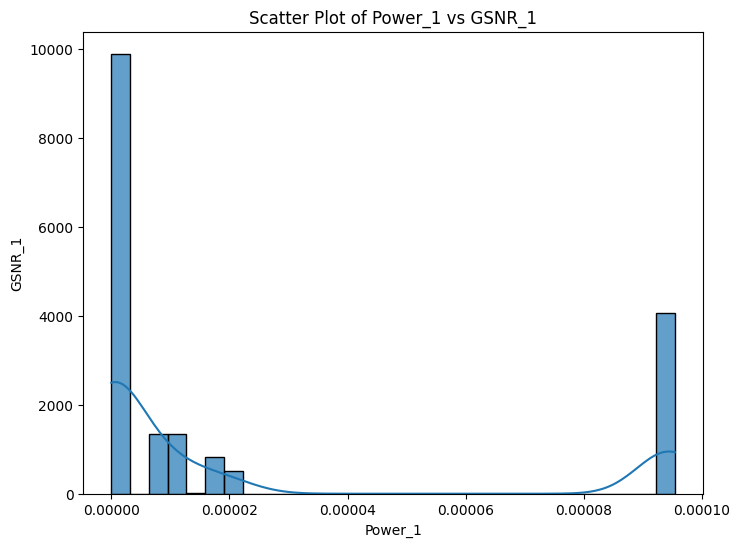

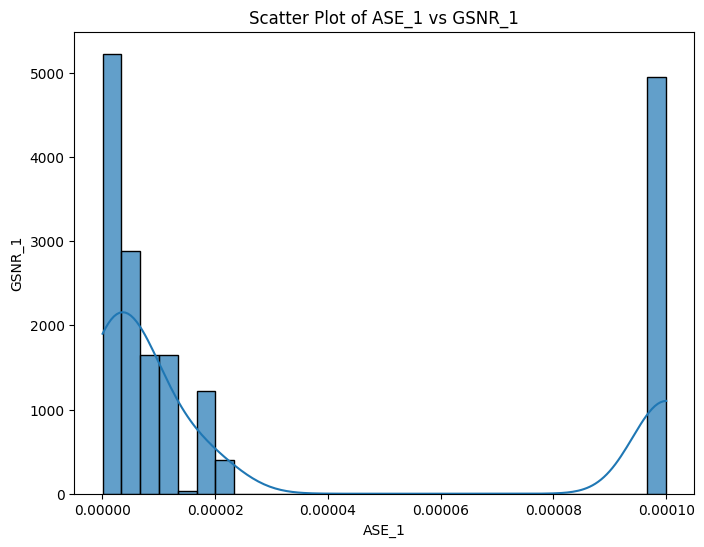

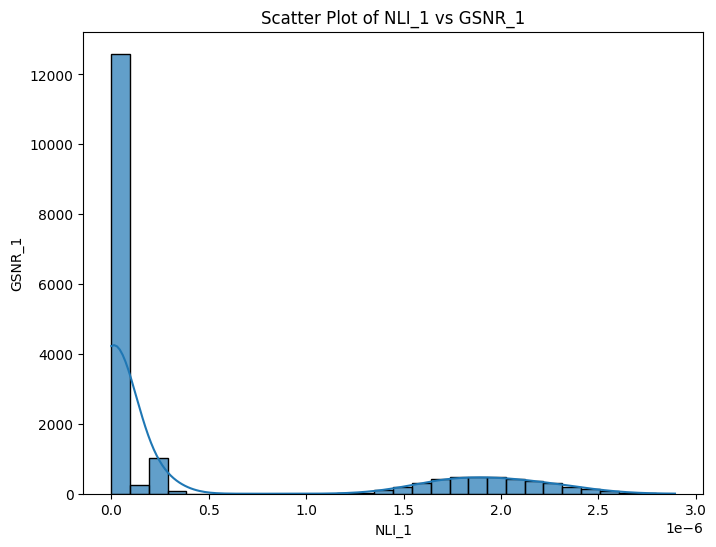

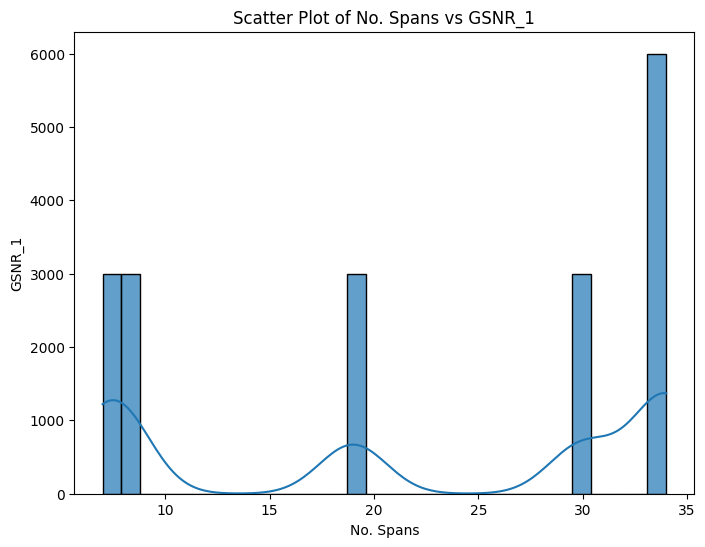

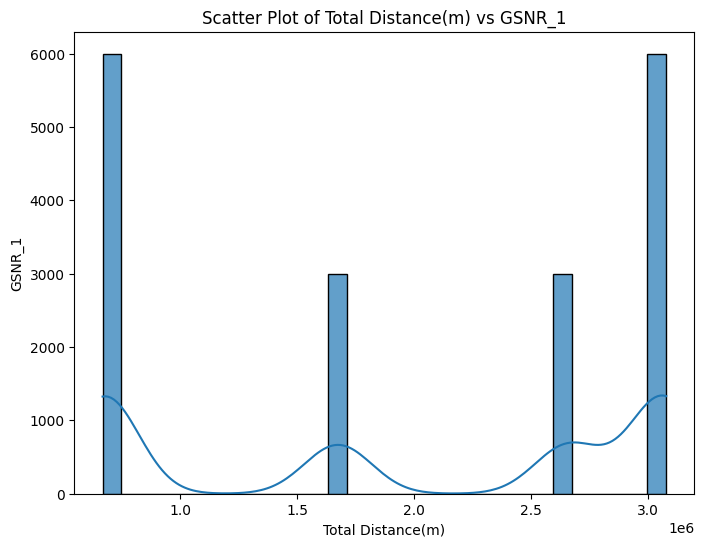

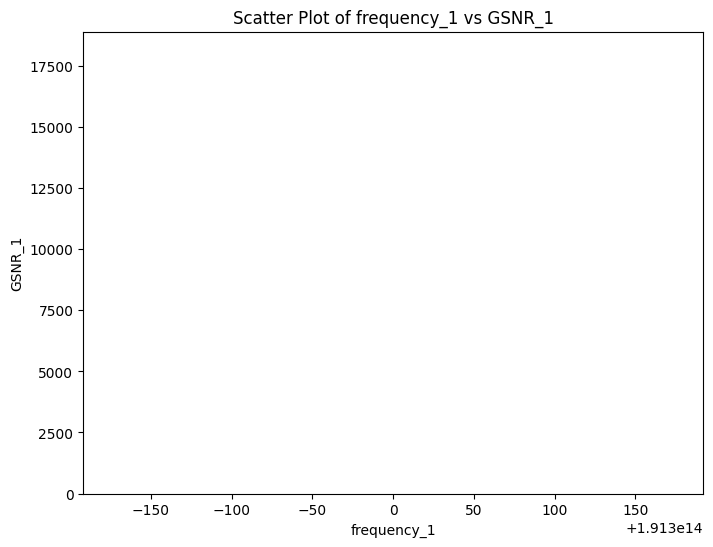

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the attribute columns and the target variable
attribute_columns = [f'Power_{i}' for i in range(1, 2)] + [f'ASE_{i}' for i in range(1, 2)] + [f'NLI_{i}' for i in range(1, 2)]+ ['No. Spans'] + ['Total Distance(m)'] + [f'frequency_{i}' for i in range(1, 2)]
target_column = 'GSNR_1'

# Assuming 'data' is your DataFrame containing attribute columns and the target variable
correlation_matrix = data[attribute_columns + [target_column]].corr()

# Print the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# Plot histogram plots for each attribute column against the target variable
for column in attribute_columns:
    plt.figure(figsize=(8, 6))
    # sns.scatterplot(data=data, x=column, y=target_column, alpha=0.7)
    sns.histplot(data=data, x=column, kde=True, bins=30, alpha=0.7)
    plt.title(f'Scatter Plot of {column} vs {target_column}')
    plt.xlabel(column)
    plt.ylabel(target_column)
    plt.show()


# Normalization

In [ ]:
from scipy.stats import pearsonr
from sklearn.preprocessing import StandardScaler, MinMaxScaler

attribute_columns = [f'Power_{i}' for i in range(1, 77)] + [f'ASE_{i}' for i in range(1, 77)] + [f'NLI_{i}' for i in range(1, 77)]+ ['No. Spans'] + ['Total Distance(m)'] + [f'frequency_{i}' for i in range(1, 77)]

print(len(attribute_columns))

# MinMax Normalization
scaler = MinMaxScaler()
mxdata = scaler.fit_transform(data[attribute_columns])
mxdata = pd.DataFrame(mxdata, columns=attribute_columns)

label = data[target_column].values.reshape(-1, 1)
mydata = scaler.fit_transform(label)
mydata = pd.DataFrame(mydata, columns=[target_column])

# Display the first few rows of the normalized data
print("MinMax Normalized Data:")
print(mxdata['Power_1'].head(),mxdata['ASE_1'].head(),mxdata['NLI_1'].head(),mxdata['frequency_1'].head(),mxdata['No. Spans'].head(),mxdata['Total Distance(m)'].head())
print(mydata.head())


306
MinMax Normalized Data:
0    0.000000
1    0.000000
2    0.000000
3    0.076798
4    0.000000
Name: Power_1, dtype: float64 0    0.075117
1    0.073203
2    0.073788
3    0.000062
4    0.071547
Name: ASE_1, dtype: float64 0    0.000000
1    0.000000
2    0.000000
3    0.017928
4    0.000000
Name: NLI_1, dtype: float64 0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: frequency_1, dtype: float64 0    0.037037
1    0.037037
2    0.037037
3    0.037037
4    0.037037
Name: No. Spans, dtype: float64 0    0.008849
1    0.008849
2    0.008849
3    0.008849
4    0.008849
Name: Total Distance(m), dtype: float64
    GSNR_1
0  0.00000
1  0.00000
2  0.00000
3  0.79791
4  0.00000


# Correlations

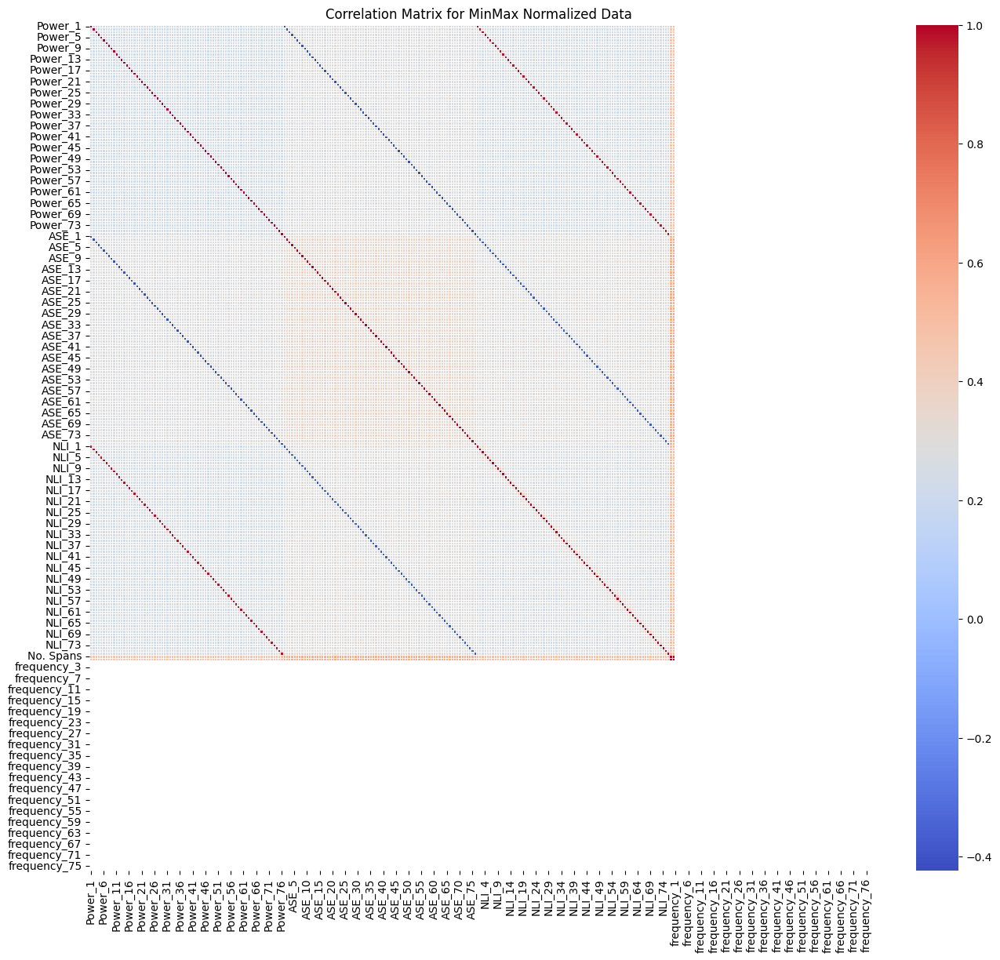

In [ ]:
# Compute correlation matrices
# MinMax Normalized Data
minmax_corr_matrix = mxdata.corr()

# Visualize correlation matrices using heatmaps
plt.figure(figsize=(16, 14))
sns.heatmap(minmax_corr_matrix, annot=False, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix for MinMax Normalized Data')
plt.show()

# The empty space at frequency column and row show that there is not any correlation due to constant values of freqency

# Train Test Split

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Define the function to split data according to the specified pattern
def custom_train_test_split(data, labels, samples_per_block=3000, train_samples_per_block=2500, test_samples_per_block=500):
    train_data = []
    test_data = []
    train_labels = []
    test_labels = []

    total_samples = len(data)

    for start in range(0, total_samples, samples_per_block):
        end = start + samples_per_block
        train_end = start + train_samples_per_block

        if train_end > total_samples:
            train_end = total_samples
        if end > total_samples:
            end = total_samples

        train_data.append(data[start:train_end])
        test_data.append(data[train_end:end])
        train_labels.append(labels[start:train_end])
        test_labels.append(labels[train_end:end])

    train_data = pd.concat(train_data).reset_index(drop=True)
    test_data = pd.concat(test_data).reset_index(drop=True)
    train_labels = pd.concat(train_labels).reset_index(drop=True)
    test_labels = pd.concat(test_labels).reset_index(drop=True)

    return train_data, test_data, train_labels, test_labels

# Assuming 'zxdata' and 'zydata' are your DataFrames for Z-score normalized data
attribute_columns_without_frequency = [col for col in attribute_columns if not col.startswith('frequency')]

# Assuming 'mxdata' and 'mydata' are your DataFrames for MinMax normalized data
mxdata_train, mxdata_test, mydata_train, mydata_test = custom_train_test_split(mxdata[attribute_columns_without_frequency], mydata[target_column])



print("\nMinMax normalized data:")
print("Train data shape:", mxdata_train.shape)
print("Test data shape:", mxdata_test.shape)
print("Train labels shape:", mydata_train.shape)
print("Test labels shape:", mydata_test.shape)



MinMax normalized data:
Train data shape: (15000, 230)
Test data shape: (3000, 230)
Train labels shape: (15000,)
Test labels shape: (3000,)


# Models

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import mean_squared_error

# Initialize regression models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest Regression': RandomForestRegressor(),
    'Gradient Boosting Regression': GradientBoostingRegressor(),
    'Decision Tree Regression': DecisionTreeRegressor()
}

# Train and evaluate each model on MinMax normalized data
print("\nMinMax Normalized Data:")
for model_name, model in models.items():
    model.fit(mxdata_train, mydata_train)
    mydata_pred = model.predict(mxdata_test)
    mse = mean_squared_error(mydata_test, mydata_pred)
    print(f"{model_name}: Mean Squared Error = {mse:.6f}")



MinMax Normalized Data:
Linear Regression: Mean Squared Error = 0.046565
Random Forest Regression: Mean Squared Error = 0.000035
Gradient Boosting Regression: Mean Squared Error = 0.000028
Decision Tree Regression: Mean Squared Error = 0.000073


# Prediction Visualization

In [ ]:
import warnings
# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning, message="X does not have valid feature names")

# Function to predict using a single input and a trained model
def predict_single(model, input_data):
    prediction = model.predict([input_data])  # Input data should be a list or array-like
    return prediction[0]

print("\nSingle input predictions (MinMax Normalized Data):")

#MinMax Normalized Data
# Example usage of the predict_single function
single_input = mxdata_test.iloc[2512]  # Using .iloc to get the first row
print(mydata_test.iloc[2512] )

#Visualization of comparison between actual values with the predicted ones.

for model_name, model in models.items():
    prediction = predict_single(model, single_input)
    print(f"{model_name}: Prediction = {prediction:.6f}")


Single input predictions (MinMax Normalized Data):
0.7282557367898295
Linear Regression: Prediction = 0.341270
Random Forest Regression: Prediction = 0.725237
Gradient Boosting Regression: Prediction = 0.726510
Decision Tree Regression: Prediction = 0.746698


# Libraries for XAI

In [ ]:
!pip install shap lime pdpbox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 75.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 80.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.7/572.7 kB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 51.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.1/121.1 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.9/190.9 MB 2.0 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=fc7728fe24d2feda5da2c68b3255c5576112649148452dc3354007f55646dd03
  Stored in directo

In [ ]:
import shap
import lime
from lime.lime_tabular import LimeTabularExplainer
from pdpbox import pdp, info_plots

# SHAP for Global Interpretability

SHAP Analysis:

Linear Regression SHAP Summary Plot:


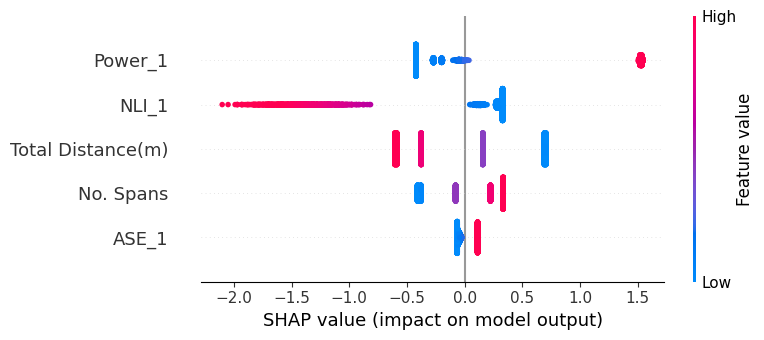


Linear Regression SHAP Dependence Plot for feature: Power_1


<Figure size 600x400 with 0 Axes>

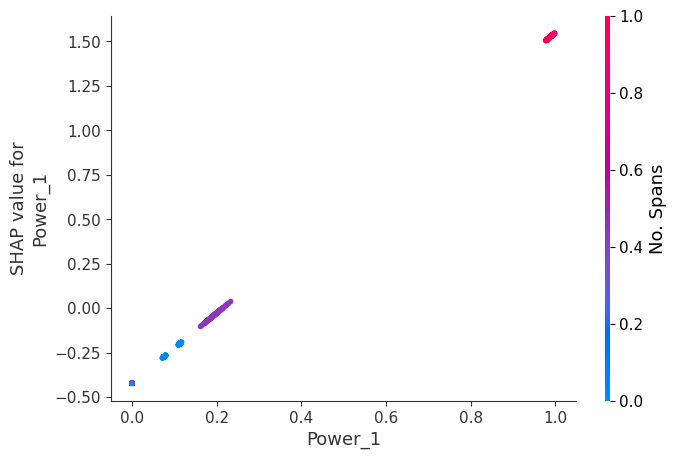


Linear Regression SHAP Dependence Plot for feature: NLI_1


<Figure size 600x400 with 0 Axes>

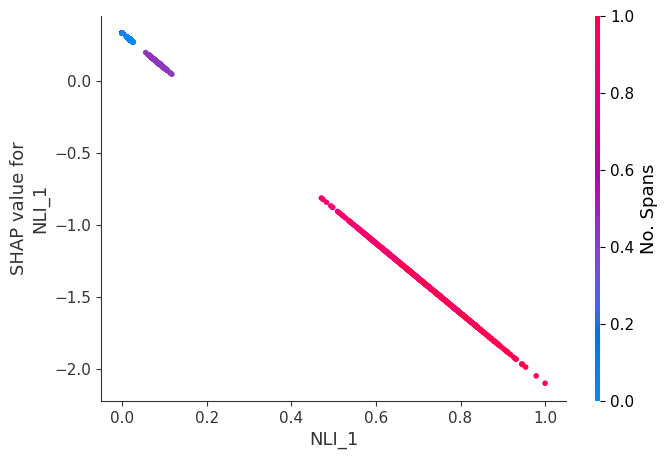


Linear Regression SHAP Dependence Plot for feature: ASE_1


<Figure size 600x400 with 0 Axes>

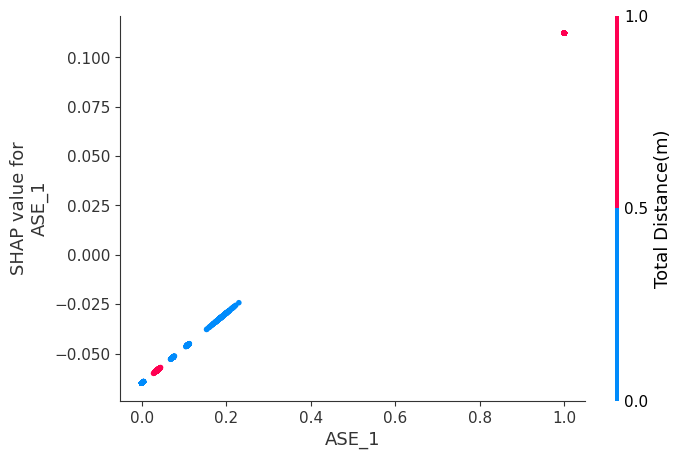


Linear Regression SHAP Dependence Plot for feature: No. Spans


<Figure size 600x400 with 0 Axes>

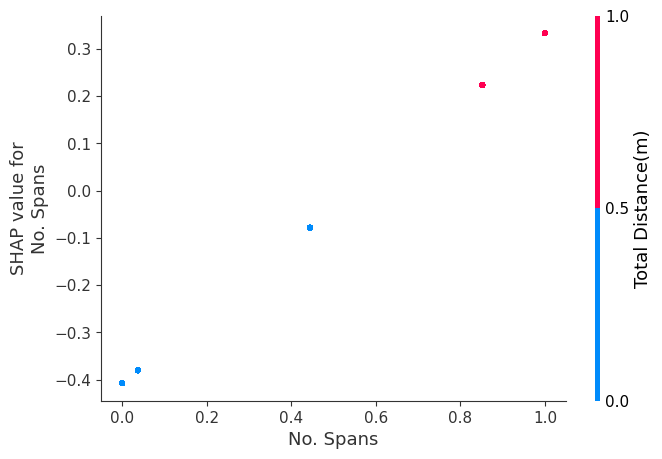


Linear Regression SHAP Dependence Plot for feature: Total Distance(m)


<Figure size 600x400 with 0 Axes>

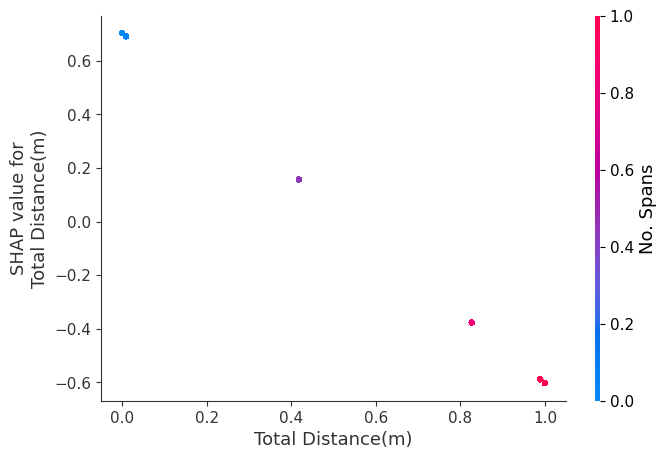

100%|===================| 2987/3000 [01:56<00:00]       


Random Forest Regression SHAP Summary Plot:


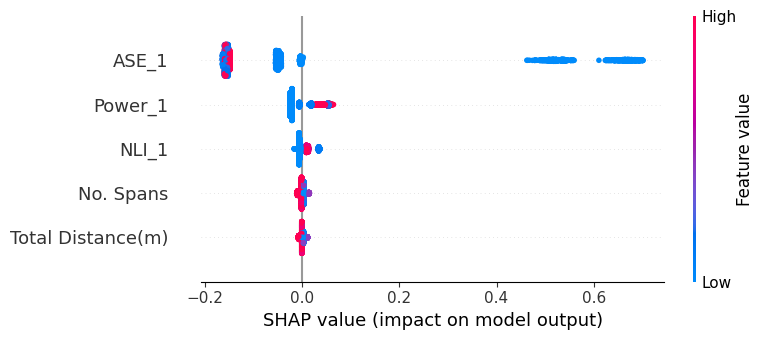


Random Forest Regression SHAP Dependence Plot for feature: Power_1


<Figure size 600x400 with 0 Axes>

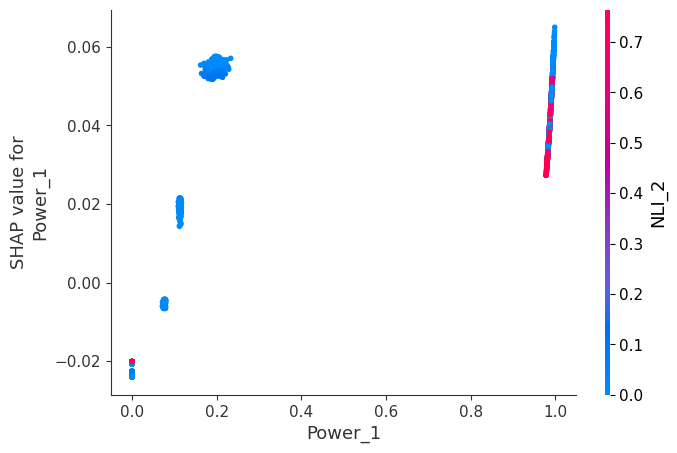


Random Forest Regression SHAP Dependence Plot for feature: NLI_1


<Figure size 600x400 with 0 Axes>

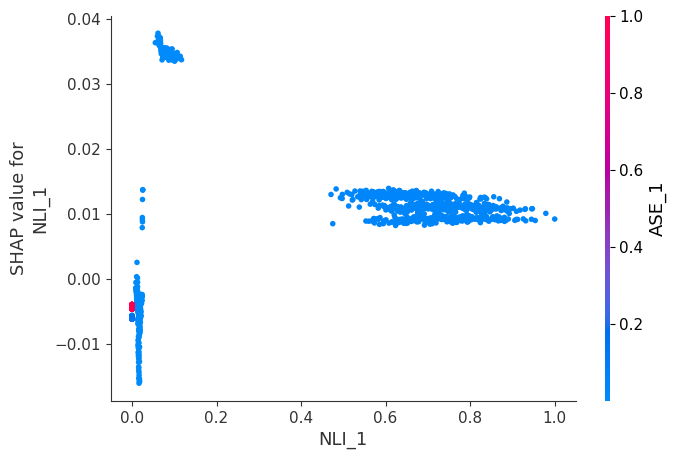


Random Forest Regression SHAP Dependence Plot for feature: ASE_1


<Figure size 600x400 with 0 Axes>

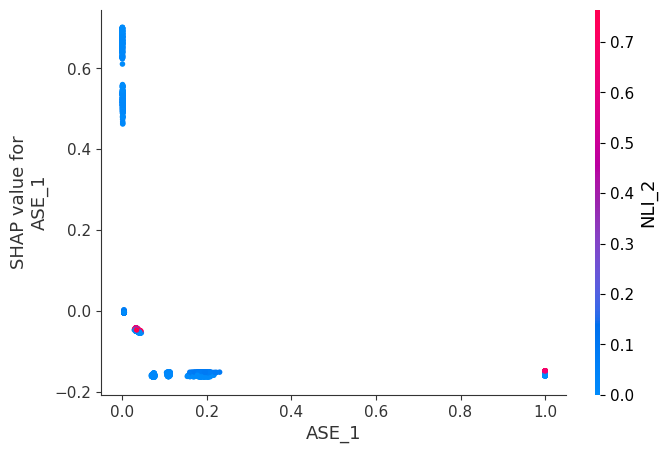


Random Forest Regression SHAP Dependence Plot for feature: No. Spans


<Figure size 600x400 with 0 Axes>

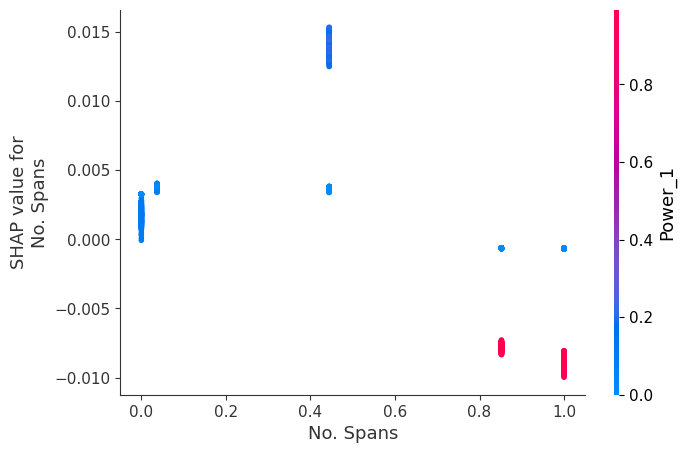


Random Forest Regression SHAP Dependence Plot for feature: Total Distance(m)


<Figure size 600x400 with 0 Axes>

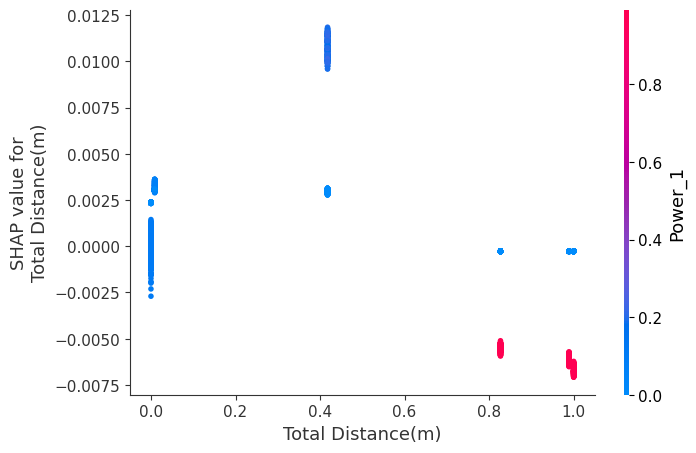


Gradient Boosting Regression SHAP Summary Plot:


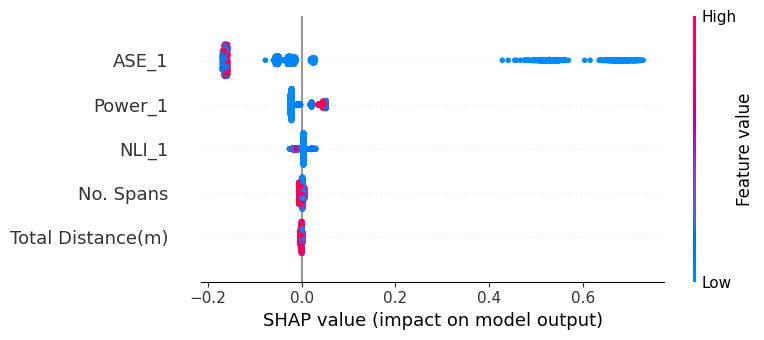


Gradient Boosting Regression SHAP Dependence Plot for feature: Power_1


<Figure size 600x400 with 0 Axes>

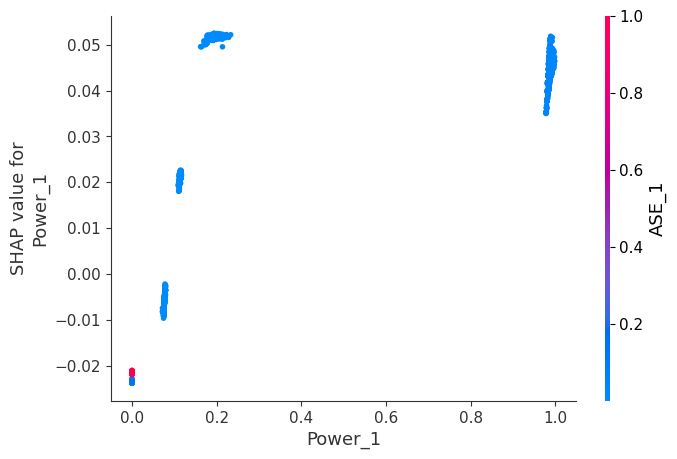


Gradient Boosting Regression SHAP Dependence Plot for feature: NLI_1


<Figure size 600x400 with 0 Axes>

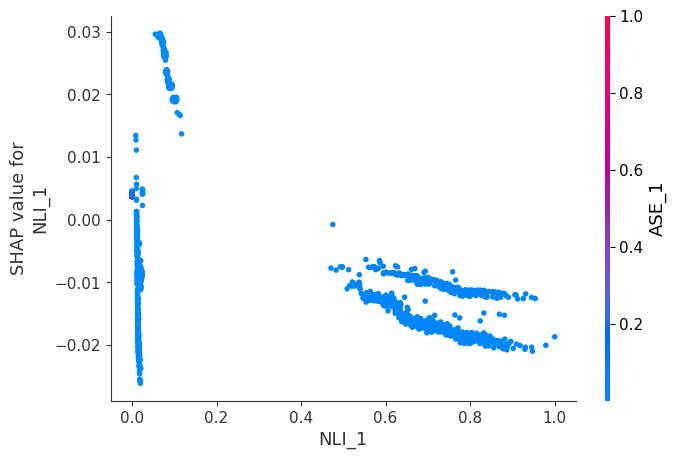


Gradient Boosting Regression SHAP Dependence Plot for feature: ASE_1


<Figure size 600x400 with 0 Axes>

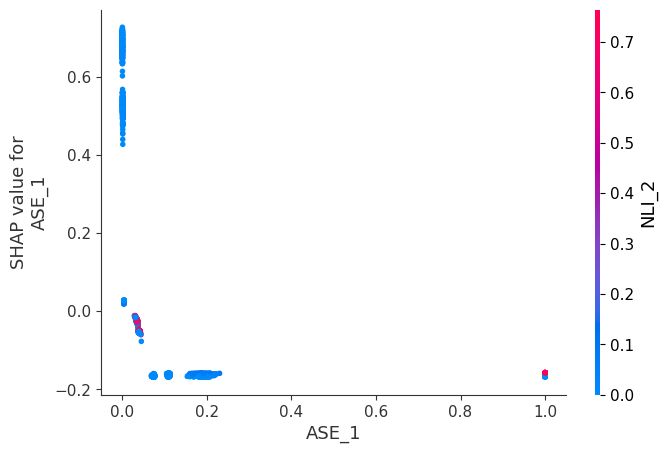


Gradient Boosting Regression SHAP Dependence Plot for feature: No. Spans


<Figure size 600x400 with 0 Axes>

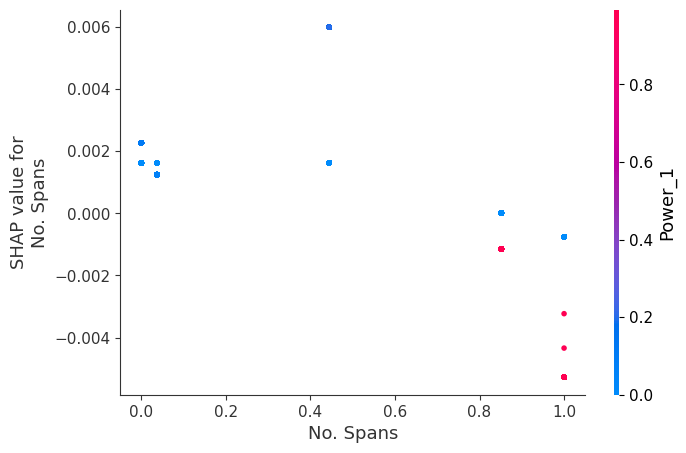


Gradient Boosting Regression SHAP Dependence Plot for feature: Total Distance(m)


<Figure size 600x400 with 0 Axes>

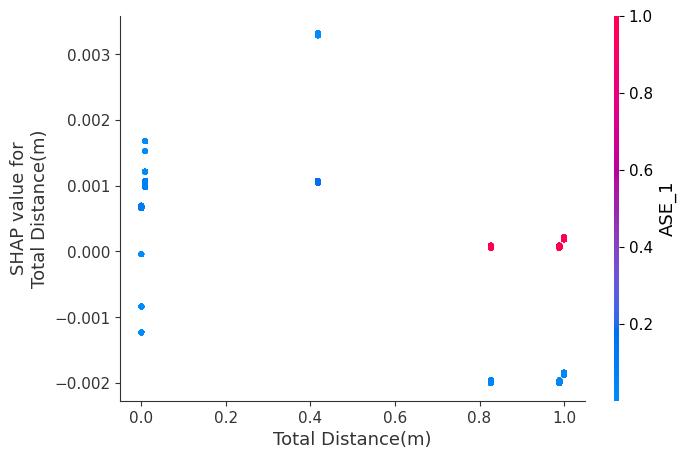


Decision Tree Regression SHAP Summary Plot:


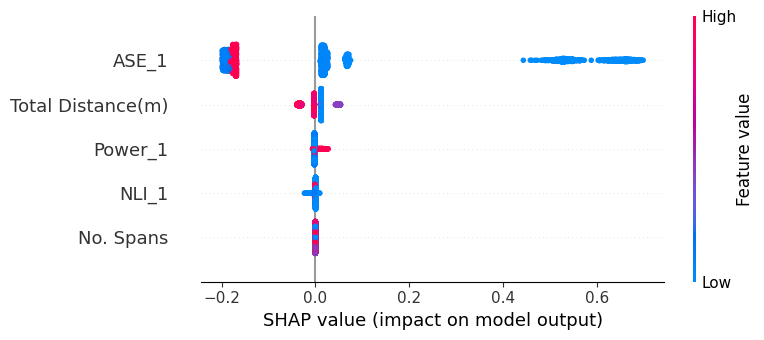


Decision Tree Regression SHAP Dependence Plot for feature: Power_1


<Figure size 600x400 with 0 Axes>

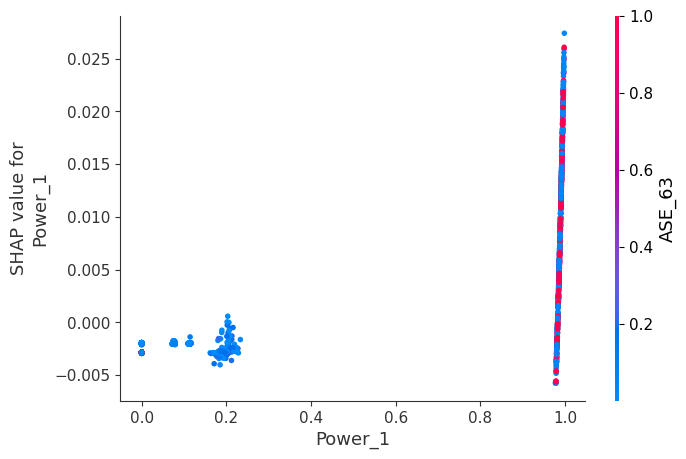


Decision Tree Regression SHAP Dependence Plot for feature: NLI_1


<Figure size 600x400 with 0 Axes>

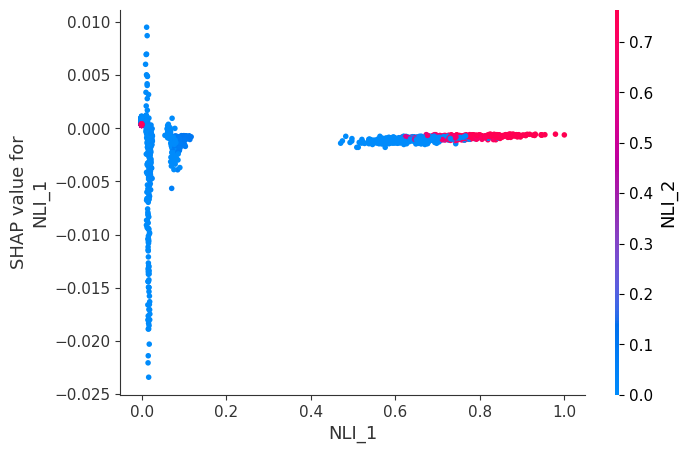


Decision Tree Regression SHAP Dependence Plot for feature: ASE_1


<Figure size 600x400 with 0 Axes>

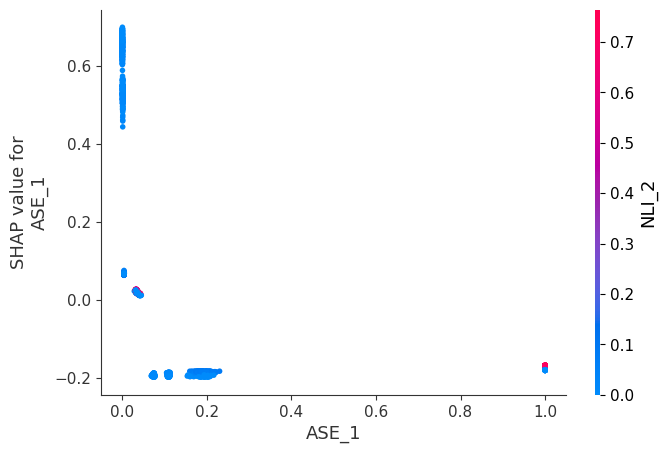


Decision Tree Regression SHAP Dependence Plot for feature: No. Spans


<Figure size 600x400 with 0 Axes>

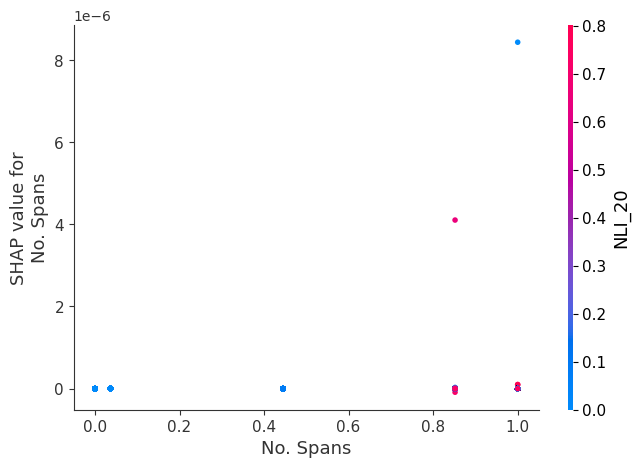


Decision Tree Regression SHAP Dependence Plot for feature: Total Distance(m)


<Figure size 600x400 with 0 Axes>

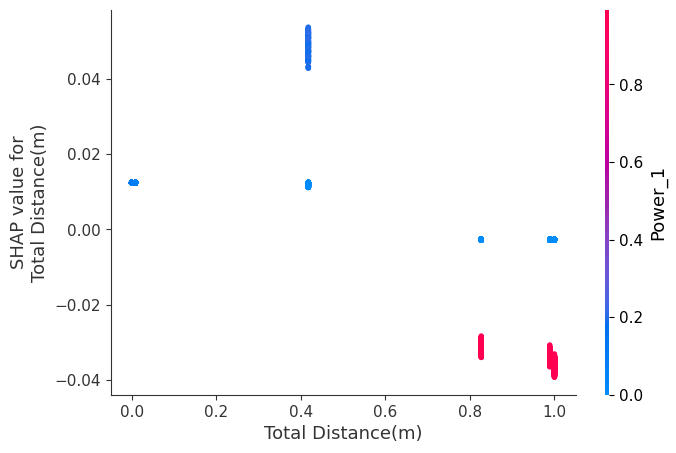

In [ ]:
features_to_plot = ['Power_1', 'NLI_1', 'ASE_1', 'No. Spans', 'Total Distance(m)']

print("SHAP Analysis:")
for model_name, model in models.items():
    if model_name in ["Linear Regression"]:  # Adjust this list for models requiring LinearExplainer
        explainer = shap.LinearExplainer(model, mxdata_train)
    else:
        explainer = shap.Explainer(model, mxdata_train)

    shap_values = explainer(mxdata_test)

    # Filter mxdata_test to include only the specified features
    filtered_data = mxdata_test[features_to_plot]

    # Summary Plot with smaller figure size
    print(f"\n{model_name} SHAP Summary Plot:")
    plt.figure(figsize=(4, 4))  # Adjust the figure size as needed (width, height)
    shap.summary_plot(shap_values[:, [mxdata_test.columns.get_loc(feature) for feature in features_to_plot]],
                      filtered_data, feature_names=features_to_plot)
    plt.show()

    # Dependence Plots for all specified features
    for feature in features_to_plot:
        print(f"\n{model_name} SHAP Dependence Plot for feature: {feature}")
        plt.figure(figsize=(6, 4))  # Adjust the figure size as needed (width, height)
        shap.dependence_plot(feature, shap_values.values if hasattr(shap_values, 'values') else shap_values, mxdata_test)
        plt.show()


# Lime for Local Interpretebility

In [ ]:
import numpy as np
from lime.lime_tabular import LimeTabularExplainer

features_to_plot = ['Power_1', 'NLI_1', 'ASE_1', 'No. Spans', 'Total Distance(m)']

print("LIME Analysis:")
for model_name, model in models.items():
    explainer = LimeTabularExplainer(training_data=np.array(mxdata_train),
                                     feature_names=mxdata_train.columns,
                                     mode='regression')

    # Explain a specific instance (e.g., first instance in the test set)
    i = 0  # You can loop over multiple instances or select specific ones
    exp = explainer.explain_instance(mxdata_test.iloc[i], model.predict, num_features=len(features_to_plot))

    # Filter the explanation to include only the specified features
    exp_list = [(name, weight) for name, weight in exp.as_list() if name in features_to_plot]

    print(f"\n{model_name} LIME Explanation for instance {i} (Filtered for specific features):")

    # You can visualize the filtered explanation in the notebook
    exp.show_in_notebook(show_all=False)

    # Manually print the filtered explanation
    for feature_name, feature_weight in exp_list:
        print(f"{feature_name}: {feature_weight}")


LIME Analysis:

Linear Regression LIME Explanation for instance 0 (Filtered for specific features):



Random Forest Regression LIME Explanation for instance 0 (Filtered for specific features):



Gradient Boosting Regression LIME Explanation for instance 0 (Filtered for specific features):



Decision Tree Regression LIME Explanation for instance 0 (Filtered for specific features):


# PDP for Feature Influence


MinMax Normalized Data:
Linear Regression: Mean Squared Error = 0.046565
Calculating PDP for Linear Regression on features: ['Power_1', 'NLI_1', 'ASE_1', 'No. Spans', 'Total Distance(m)']...


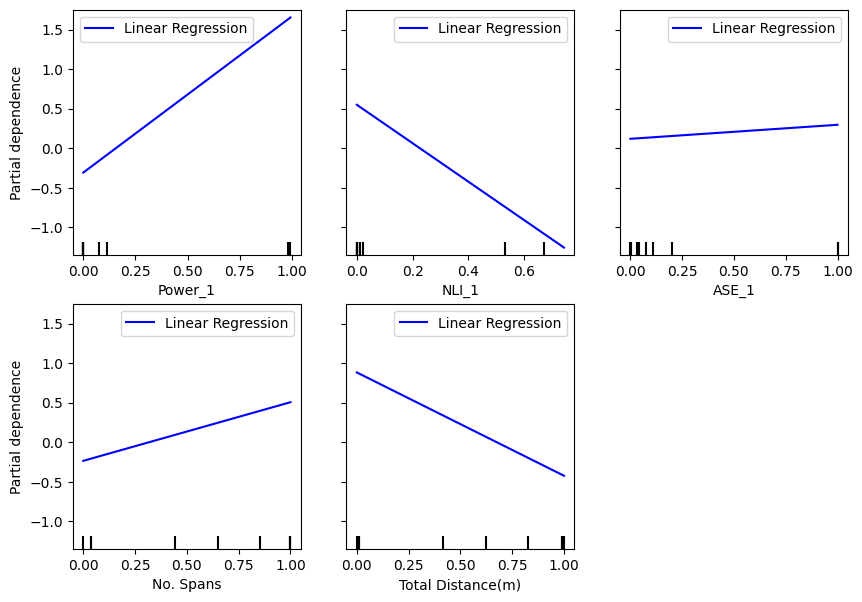

Random Forest Regression: Mean Squared Error = 0.000036
Calculating PDP for Random Forest Regression on features: ['Power_1', 'NLI_1', 'ASE_1', 'No. Spans', 'Total Distance(m)']...


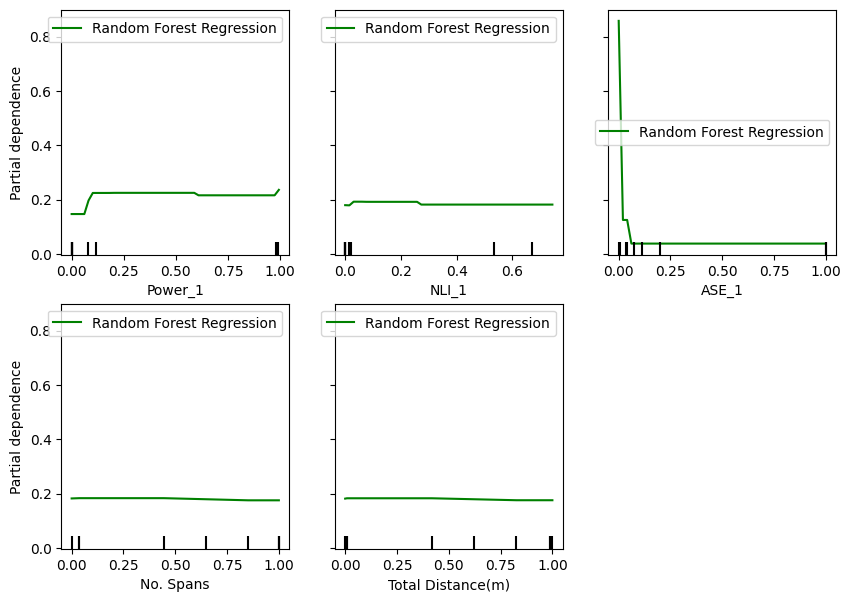

Gradient Boosting Regression: Mean Squared Error = 0.000028
Calculating PDP for Gradient Boosting Regression on features: ['Power_1', 'NLI_1', 'ASE_1', 'No. Spans', 'Total Distance(m)']...


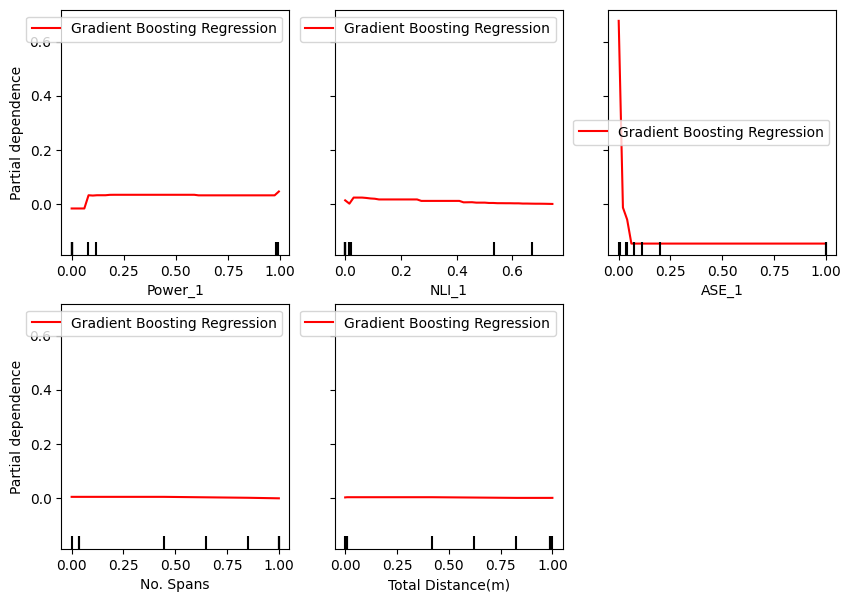

Decision Tree Regression: Mean Squared Error = 0.000073
Calculating PDP for Decision Tree Regression on features: ['Power_1', 'NLI_1', 'ASE_1', 'No. Spans', 'Total Distance(m)']...


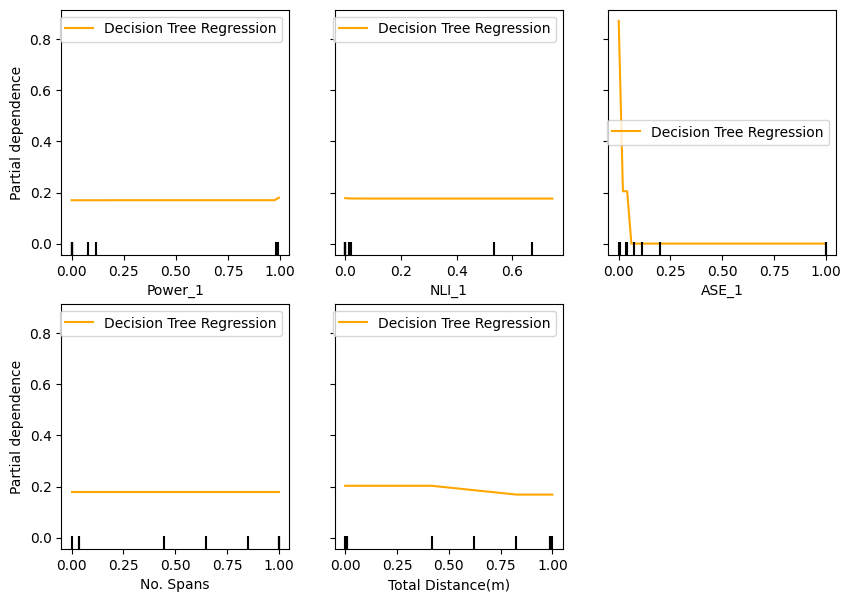

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# List of feature names for which you want to calculate the PDP
features_to_plot = ['Power_1', 'NLI_1', 'ASE_1', 'No. Spans', 'Total Distance(m)']  # Replace with the names of the features you want to analyze

# Colors for each model
colors = ['blue', 'green', 'red', 'orange']  # You can add more colors if needed

# Train and evaluate each model on MinMax normalized data
print("\nMinMax Normalized Data:")
for i, (model_name, model) in enumerate(models.items()):
    model.fit(mxdata_train, mydata_train)
    mydata_pred = model.predict(mxdata_test)
    mse = mean_squared_error(mydata_test, mydata_pred)
    print(f"{model_name}: Mean Squared Error = {mse:.6f}")

    # Calculate and plot PDP for the selected features
    print(f"Calculating PDP for {model_name} on features: {features_to_plot}...")

    # Plot PDP
    fig, ax = plt.subplots(figsize=(10, 7))
    display = PartialDependenceDisplay.from_estimator(
        model,
        mxdata_train,
        features_to_plot,
        ax=ax,
        grid_resolution=50,  # Increase grid resolution for smoother plots
        line_kw={'color': colors[i], 'label': model_name}
    )



    plt.show()


# Ice Plot for Individual Feature Influence

ICE Plot Analysis:

Linear Regression ICE Plot for Power_1:


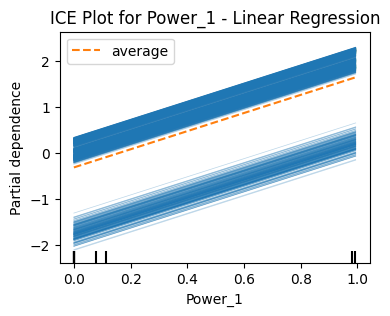

<Figure size 400x300 with 0 Axes>


Linear Regression ICE Plot for NLI_1:


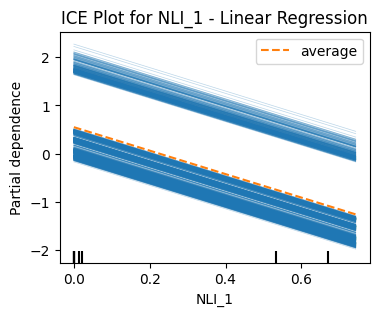

<Figure size 400x300 with 0 Axes>


Linear Regression ICE Plot for ASE_1:


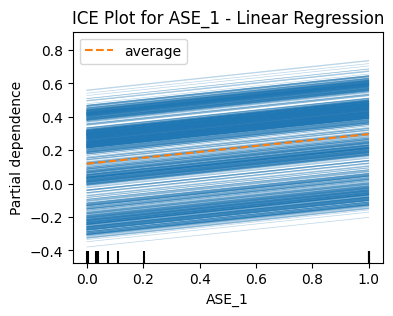

<Figure size 400x300 with 0 Axes>


Linear Regression ICE Plot for No. Spans:


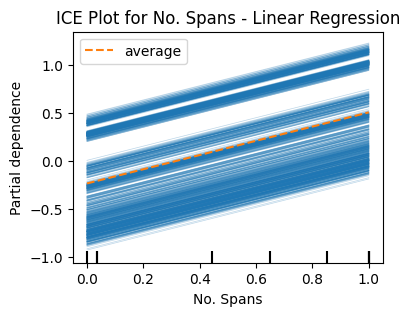

<Figure size 400x300 with 0 Axes>


Linear Regression ICE Plot for Total Distance(m):


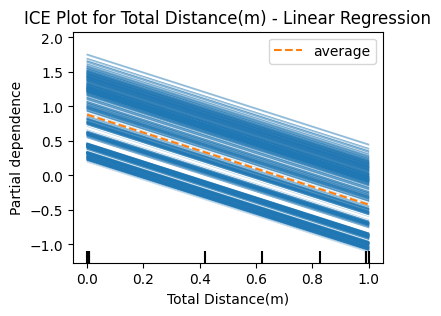

<Figure size 400x300 with 0 Axes>


Random Forest Regression ICE Plot for Power_1:


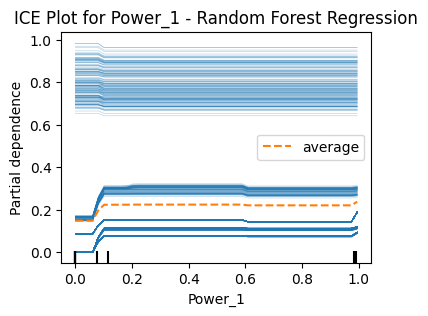

<Figure size 400x300 with 0 Axes>


Random Forest Regression ICE Plot for NLI_1:


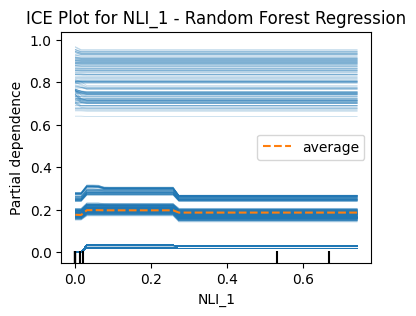

<Figure size 400x300 with 0 Axes>


Random Forest Regression ICE Plot for ASE_1:


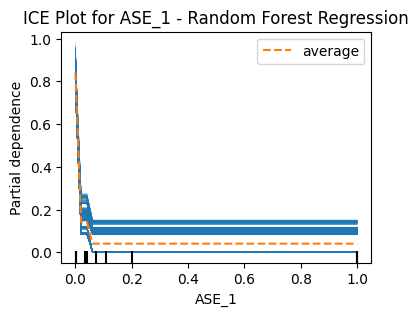

<Figure size 400x300 with 0 Axes>


Random Forest Regression ICE Plot for No. Spans:


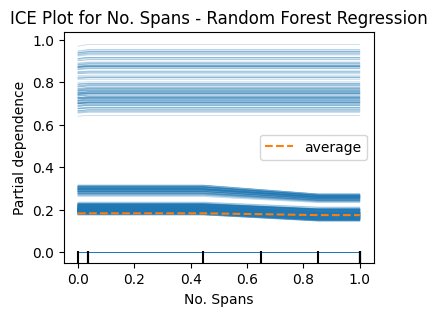

<Figure size 400x300 with 0 Axes>


Random Forest Regression ICE Plot for Total Distance(m):


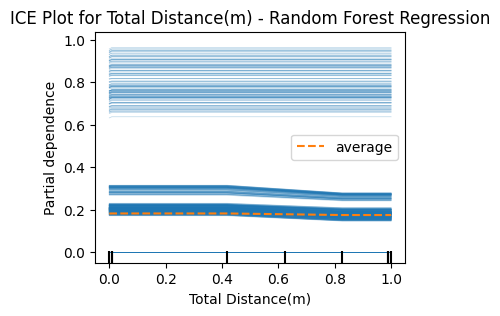

<Figure size 400x300 with 0 Axes>


Gradient Boosting Regression ICE Plot for Power_1:


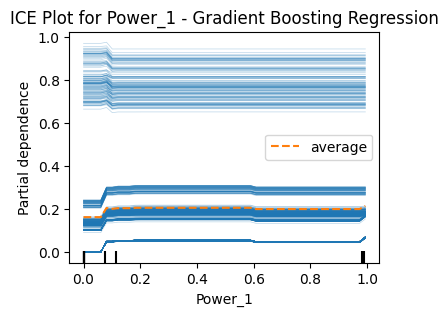

<Figure size 400x300 with 0 Axes>


Gradient Boosting Regression ICE Plot for NLI_1:


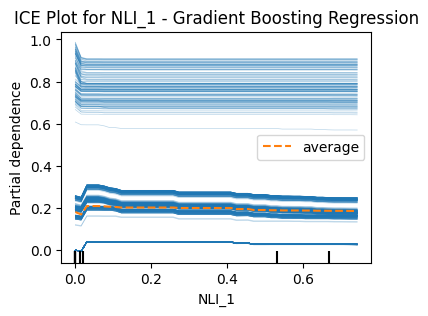

<Figure size 400x300 with 0 Axes>


Gradient Boosting Regression ICE Plot for ASE_1:


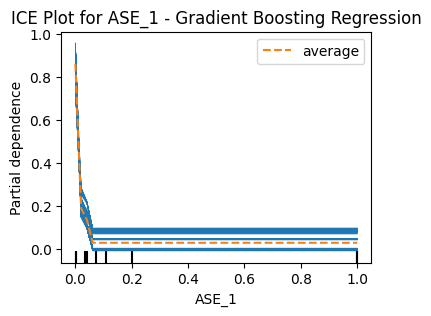

<Figure size 400x300 with 0 Axes>


Gradient Boosting Regression ICE Plot for No. Spans:


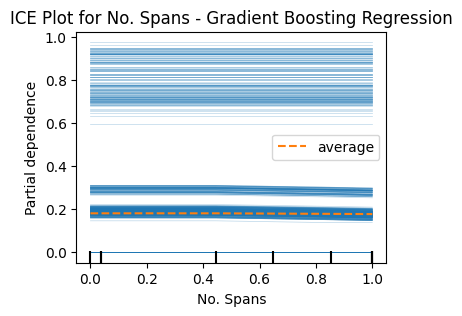

<Figure size 400x300 with 0 Axes>


Gradient Boosting Regression ICE Plot for Total Distance(m):


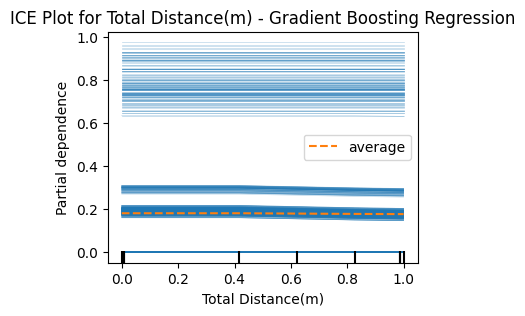

<Figure size 400x300 with 0 Axes>


Decision Tree Regression ICE Plot for Power_1:


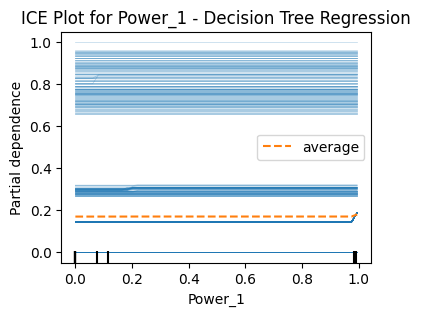

<Figure size 400x300 with 0 Axes>


Decision Tree Regression ICE Plot for NLI_1:


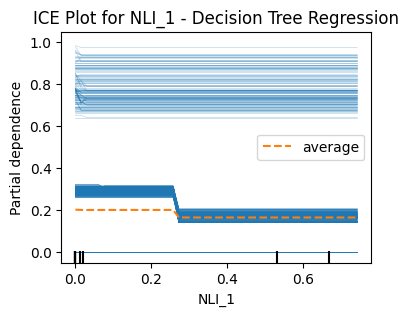

<Figure size 400x300 with 0 Axes>


Decision Tree Regression ICE Plot for ASE_1:


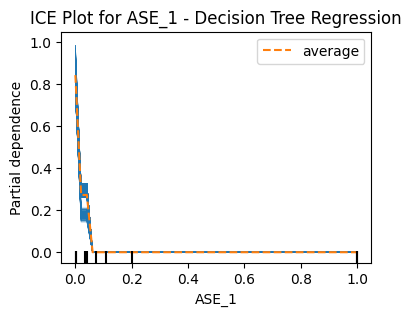

<Figure size 400x300 with 0 Axes>


Decision Tree Regression ICE Plot for No. Spans:


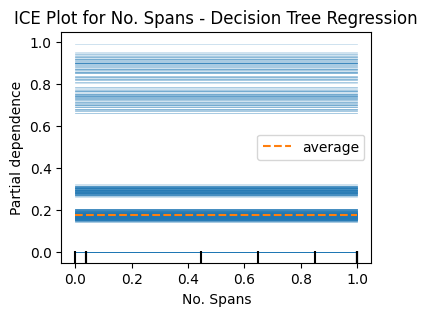

<Figure size 400x300 with 0 Axes>


Decision Tree Regression ICE Plot for Total Distance(m):


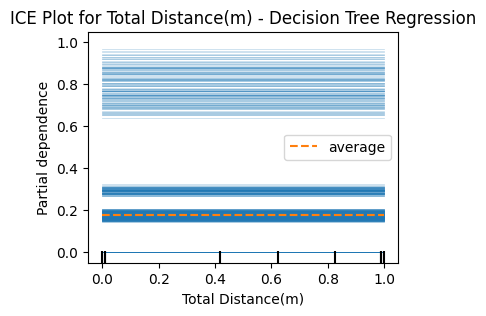

<Figure size 400x300 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# List of features for which you want to calculate the ICE plots
features_to_plot = ['Power_1', 'NLI_1', 'ASE_1', 'No. Spans', 'Total Distance(m)']

# ICE Plot Analysis
print("ICE Plot Analysis:")
for model_name, model in models.items():
    model.fit(mxdata_train, mydata_train)

    for feature in features_to_plot:
        print(f"\n{model_name} ICE Plot for {feature}:")

        # Plot ICE
        fig, ax = plt.subplots(figsize=(4, 3))
        display = PartialDependenceDisplay.from_estimator(
            model,
            mxdata_train,
            [feature],
            ax=ax,
            kind="both",  # This will plot both PDP and ICE curves
            grid_resolution=50  # Increase grid resolution for smoother plots
        )

        plt.title(f'ICE Plot for {feature} - {model_name}')
        plt.figure(figsize=(4, 3))
        plt.show()


# Saving the Models

In [ ]:
import joblib

# Save the models manually
joblib.dump(models['Linear Regression'], 'Linear_Regression.joblib')
joblib.dump(models['Random Forest Regression'], 'Random_Forest_Regression.joblib')
joblib.dump(models['Gradient Boosting Regression'], 'Gradient_Boosting_Regression.joblib')
joblib.dump(models['Decision Tree Regression'], 'Decision_Tree_Regression.joblib')


['Decision_Tree_Regression.joblib']

# Conclusion:

# Analysis Summary

## Impact of Key Factors on Global Signal-to-Noise Ratio (GSNR) in Optical Communication Networks

This analysis delved into the impact of key factors such as **Power**, **Amplified Spontaneous Emission (ASE)**, **Nonlinear Interference (NLI)**, **Number of Hops**, and **Total Distance** on the Global Signal-to-Noise Ratio (GSNR) in optical communication networks. By leveraging various interpretability techniques, including **SHAP**, **Partial Dependence Plots (PDPs)**, **LIME**, and **Individual Conditional Expectation (ICE) plots**, we gained insights into how these factors influence GSNR across different models like **Linear Regression**, **Random Forest**, **Gradient Boosting**, and **Decision Trees**.

### Key Takeaways

#### 1. Power:
- In most models, an increase in power generally led to an increase in GSNR, as expected.
- The effect was sometimes nonlinear, with optimal power levels being more beneficial before nonlinear effects (like NLI) start to degrade the signal.

#### 2. Amplified Spontaneous Emission (ASE):
- ASE consistently showed a significant impact across models.
- Higher ASE levels tended to degrade GSNR, particularly in models like Random Forest and Gradient Boosting, where ASE was one of the most influential features.

#### 3. Nonlinear Interference (NLI):
- NLI was a critical factor, especially in scenarios with higher power or longer distances.
- Higher NLI levels generally reduced GSNR, aligning with the theoretical understanding that nonlinear effects can deteriorate signal quality.

#### 4. Number of Hops:
- The number of hops had a mixed influence on GSNR.
- More hops generally reduced GSNR due to cumulative noise and nonlinear effects.
- However, in some models like Random Forest, mid-range values for hops showed higher GSNR, suggesting an optimal balance between signal regeneration and noise introduction.

#### 5. Total Distance:
- Longer distances typically reduced GSNR due to the accumulation of attenuation, ASE, and NLI.
- In some models, the relationship was more complex, with mid-range distances sometimes offering better GSNR than either very short or very long paths.

### Insights from Model Interpretations

- **SHAP Values**: Highlighted the importance and direction of each feature's impact on GSNR. Power, ASE, and NLI were the most significant factors, with ASE often showing the strongest negative impact.
  
- **PDP and ICE Plots**: Provided a more detailed view of feature interactions, confirming the non-linear relationships and the importance of finding optimal settings for Power and NLI.

- **LIME Explanations**: Showed that ASE was a critical factor across different models, but its impact could vary depending on the specific model, reflecting the complexity of its interaction with other features like Power and NLI.

### Final Conclusion

The GSNR in optical networks is highly sensitive to several interacting factors. **Optimal GSNR** is achieved by:
- Carefully balancing power levels to enhance signal strength without inducing excessive nonlinear effects.
- Minimizing ASE through efficient amplification strategies.
- Managing NLI, especially over longer distances or multiple hops.

The interpretability techniques used in this analysis provided a comprehensive understanding of how these factors influence GSNR across different modeling approaches, offering valuable insights for optimizing optical network performance.
